In [17]:
%matplotlib inline
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

output_dir = 'hasil_semua_metode'
os.makedirs(output_dir, exist_ok=True)
semua_laporan = []

def hitung_metrik(img_asli, img_hasil):
    # Ubah ke grayscale untuk perhitungan yang seragam dan menghindari error channel
    asli_gray = cv2.cvtColor(img_asli, cv2.COLOR_BGR2GRAY) if len(img_asli.shape)==3 else img_asli
    hasil_gray = cv2.cvtColor(img_hasil, cv2.COLOR_BGR2GRAY) if len(img_hasil.shape)==3 else img_hasil
    
    # Samakan dimensi jika ada perubahan ukuran (khusus kasus Upsampling)
    if asli_gray.shape != hasil_gray.shape:
        asli_gray = cv2.resize(asli_gray, (hasil_gray.shape[1], hasil_gray.shape[0]), interpolation=cv2.INTER_NEAREST)
        
    p = psnr(asli_gray, hasil_gray)
    s = ssim(asli_gray, hasil_gray, data_range=255)
    return p, s

def uji_semua_metode(nama_file):
    print(f"Memproses: {nama_file} ...")
    img = cv2.imread(nama_file)
    if img is None:
        print(f"Error: Gambar '{nama_file}' tidak ditemukan!")
        return
        
    metode_dict = {}
    
    # 1. Histogram Equalization
    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
    metode_dict['Histogram Equalization'] = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
    
    # 2. Log Transform
    img_float = img.astype(np.float32)
    c = 255 / np.log(1 + np.max(img_float))
    log_img = c * (np.log(img_float + 1))
    metode_dict['Log Transform'] = np.uint8(log_img)
    
    # 3. Image Negatives
    metode_dict['Image Negatives'] = 255 - img
    
    # 4. Log Inverse / Gamma Correction (Gamma = 2.2)
    metode_dict['Log Inverse (Gamma>1)'] = np.array(255 * (img / 255.0) ** 2.2, dtype='uint8')
    
    # 5. Sharpening (Laplacian Filter)
    kernel_laplacian = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    metode_dict['Sharpening (Laplacian)'] = cv2.filter2D(img, -1, kernel_laplacian)
    
    # 6. Sharpening (DoG - Difference of Gaussians)
    blur1 = cv2.GaussianBlur(img, (3, 3), 0)
    blur2 = cv2.GaussianBlur(img, (5, 5), 0)
    dog = cv2.subtract(blur1, blur2)
    metode_dict['Sharpening (DoG)'] = cv2.add(img, dog)
    
    # 7. Smoothing (Gaussian Filter)
    metode_dict['Smoothing (Gaussian)'] = cv2.GaussianBlur(img, (5, 5), 0)
    
    # 8. Smoothing (Mean Filter)
    metode_dict['Smoothing (Mean)'] = cv2.blur(img, (5, 5))
    
    # 9. Smoothing (Median Filter)
    metode_dict['Smoothing (Median)'] = cv2.medianBlur(img, 5)
    
    # 10. Contrast Stretching
    min_val, max_val = np.min(img), np.max(img)
    metode_dict['Contrast Stretching'] = np.uint8((img - min_val) * (255.0 / (max_val - min_val)))
    
    # 11. Upsampling / Super Res (Bicubic)
    h, w = img.shape[:2]
    metode_dict['Upsampling (Bicubic)'] = cv2.resize(img, (w*2, h*2), interpolation=cv2.INTER_CUBIC)
    
    # Plotting Grid
    fig, axes = plt.subplots(4, 3, figsize=(15, 18))
    fig.suptitle(f"Hasil Evaluasi 11 Metode pada: {nama_file}", fontsize=16)
    
    # Plot Gambar Original di posisi pertama
    ax_orig = axes[0, 0]
    ax_orig.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax_orig.set_title("0. ORIGINAL")
    ax_orig.axis('off')
    
    # Plot hasil dan hitung metrik
    axes_flat = axes.flatten()
    for idx, (nama_metode, hasil_img) in enumerate(metode_dict.items(), start=1):
        # Hitung Metrik
        val_psnr, val_ssim = hitung_metrik(img, hasil_img)
        
        # Simpan metrik ke laporan
        semua_laporan.append({
            'Gambar Asli': nama_file,
            'Metode': nama_metode,
            'PSNR (dB)': round(val_psnr, 2),
            'SSIM': round(val_ssim, 4)
        })
        
        # Simpan file
        nama_simpan = f"{os.path.splitext(os.path.basename(nama_file))[0]}_{nama_metode.replace(' ', '_')}.jpg"
        cv2.imwrite(os.path.join(output_dir, nama_simpan), hasil_img)
        
        # Tampilkan di grid
        ax = axes_flat[idx]
        ax.imshow(cv2.cvtColor(hasil_img, cv2.COLOR_BGR2RGB))
        ax.set_title(f"{idx}. {nama_metode}\nPSNR: {val_psnr:.2f} | SSIM: {val_ssim:.3f}")
        ax.axis('off')
        
    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()
    print("-" * 50)

Memproses: data/blur.jpg ...


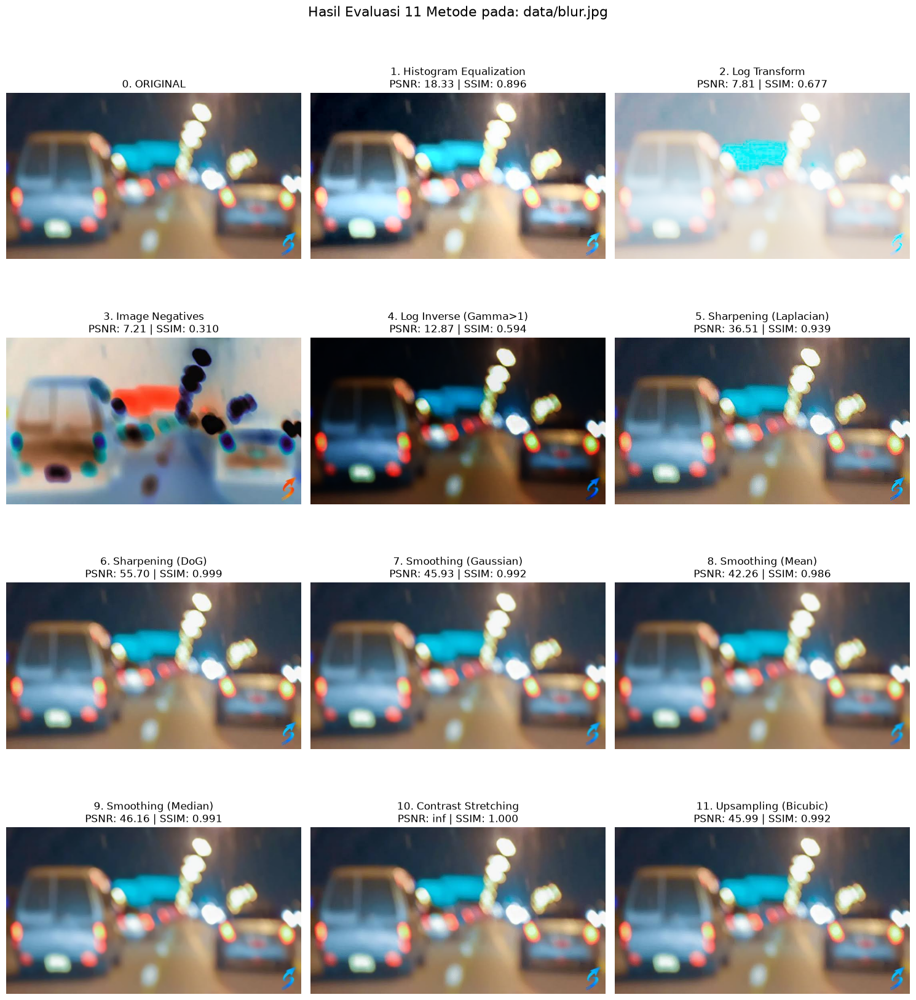

--------------------------------------------------


In [18]:
uji_semua_metode("data/blur.jpg")

Memproses: data/highresolution.jpg ...


d:\MKA\CVL\cv_env\Lib\site-packages\skimage\metrics\simple_metrics.py:171: RuntimeWarning: divide by zero encountered in scalar divide
  return 10 * np.log10((data_range**2) / err)


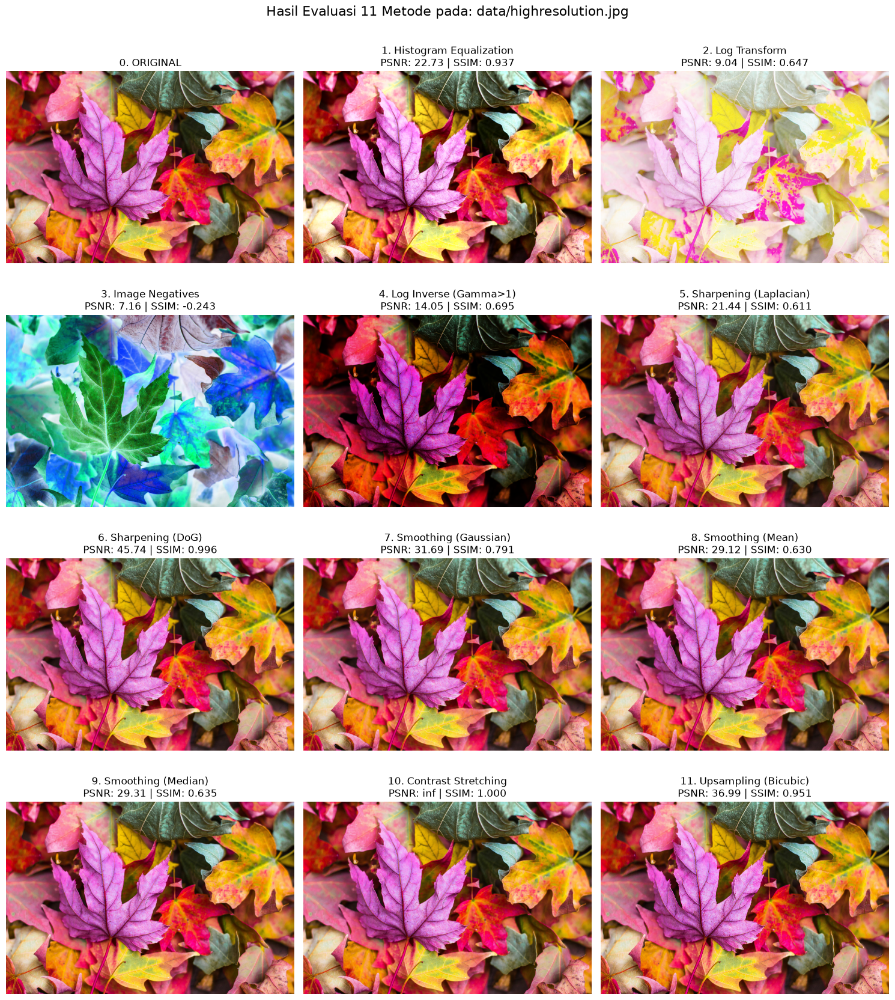

--------------------------------------------------


In [26]:
uji_semua_metode("data/highresolution.jpg")

Memproses: data/lowcontrast.jpg ...


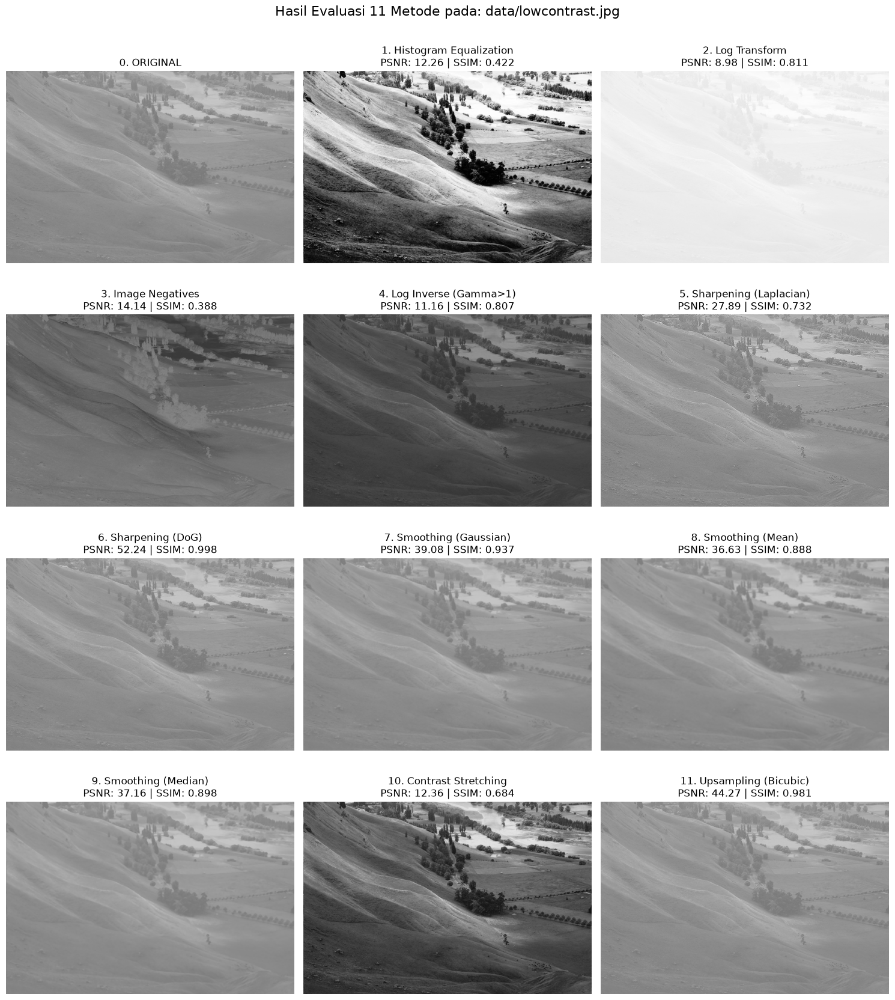

--------------------------------------------------


In [20]:
uji_semua_metode("data/lowcontrast.jpg")

Memproses: data/lowresolution.jpg ...


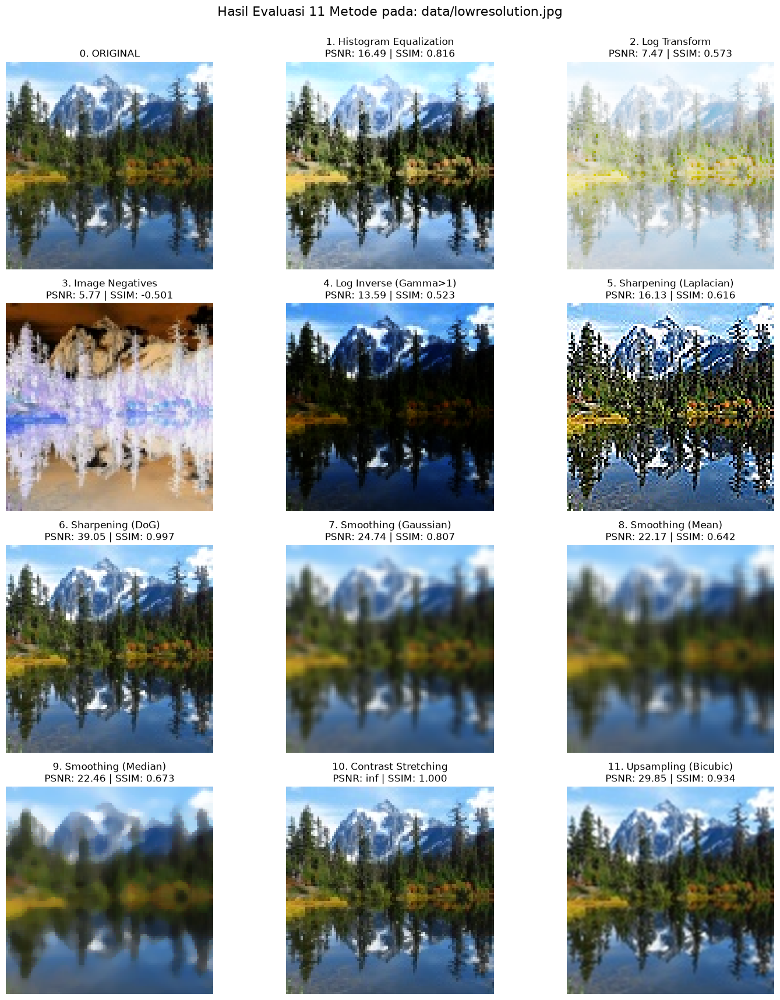

--------------------------------------------------


In [21]:
uji_semua_metode("data/lowresolution.jpg")

Memproses: data/noise.png ...


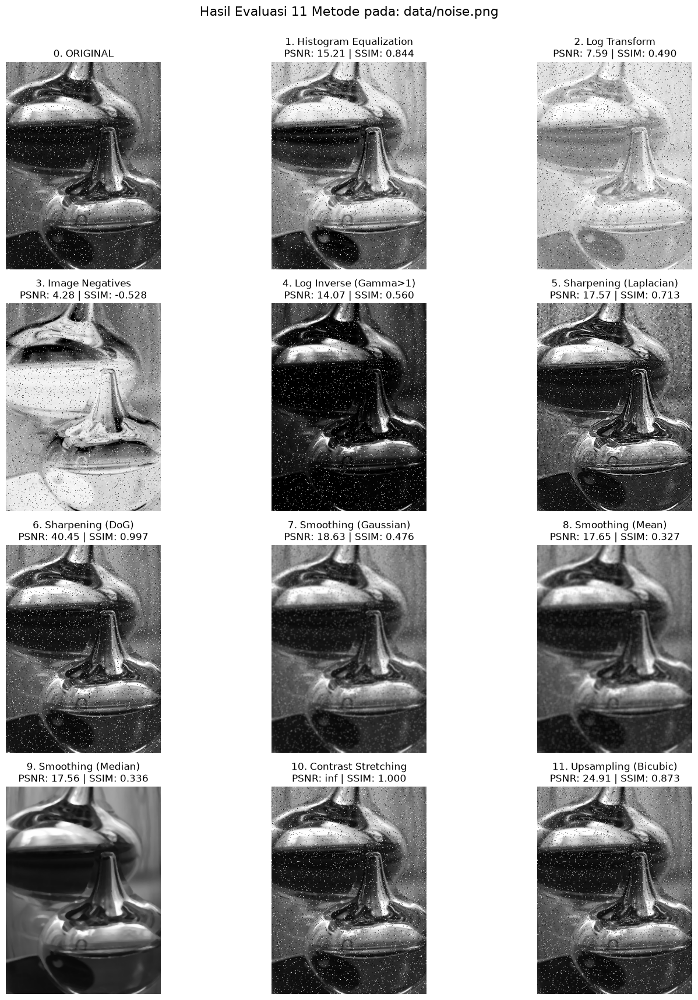

--------------------------------------------------


In [22]:
uji_semua_metode("data/noise.png")

Memproses: data/overexposed.jpg ...


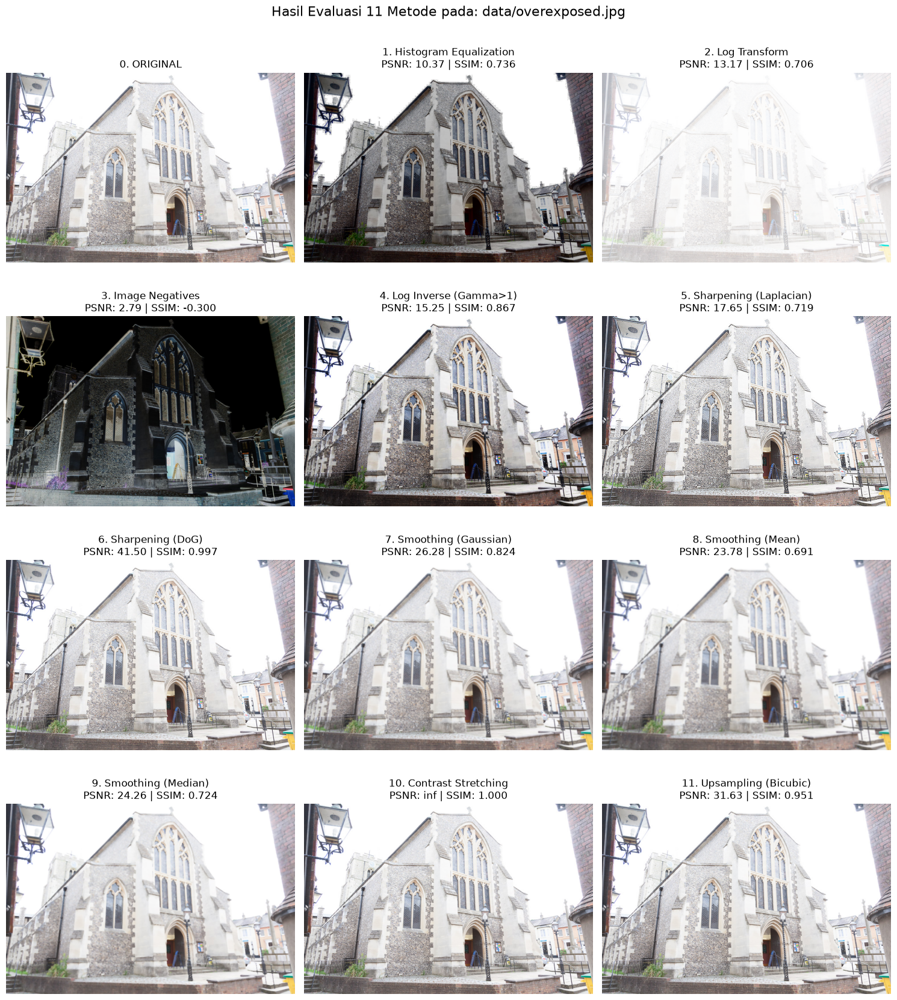

--------------------------------------------------


In [23]:
uji_semua_metode("data/overexposed.jpg")

Memproses: data/underexposed.jpg ...


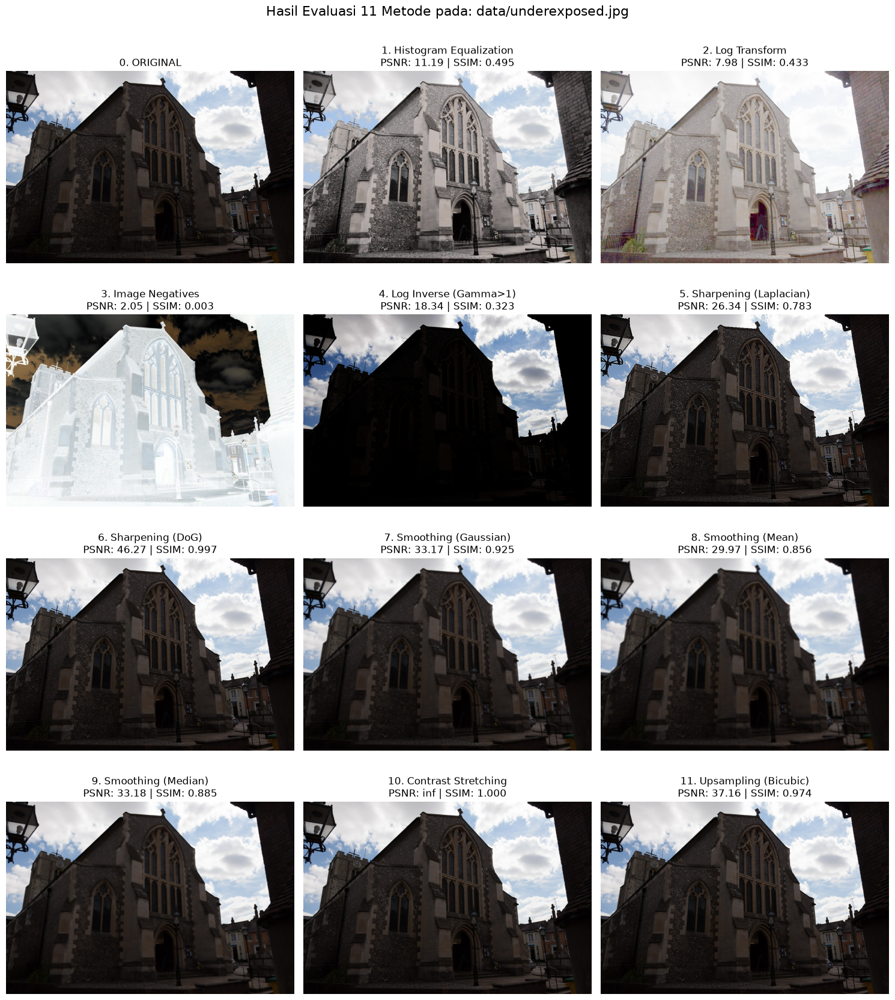

--------------------------------------------------


In [24]:
uji_semua_metode("data/underexposed.jpg")

In [25]:
# ==========================================
# BLOK 9: CETAK LAPORAN AKHIR (PANDAS DATAFRAME)
# ==========================================
df_laporan_semua = pd.DataFrame(semua_laporan)

# Opsi Pandas agar tabel terlihat penuh saat didisplay
pd.set_option('display.max_rows', None)

print("="*80)
print(f"{'LAPORAN METRIK KUALITAS - SEMUA METODE VS SEMUA GAMBAR':^80}")
print("="*80)

# Menampilkan tabel
display(df_laporan_semua)

# (Opsional) Jika Anda ingin menyimpannya ke format Excel/CSV:
df_laporan_semua.to_csv(os.path.join(output_dir, "Laporan_Metrik_Total.csv"), index=False)
print(f"\nTabel telah berhasil diekspor ke dalam folder '{output_dir}' dengan nama 'Laporan_Metrik_Total.csv'.")

             LAPORAN METRIK KUALITAS - SEMUA METODE VS SEMUA GAMBAR             


,Gambar Asli,Metode,PSNR (dB),SSIM
0,data/blur.jpg,Histogram Equalization,18.33,0.8956
1,data/blur.jpg,Log Transform,7.81,0.6768
2,data/blur.jpg,Image Negatives,7.21,0.3100
3,data/blur.jpg,Log Inverse (Gamma>1),12.87,0.5939
4,data/blur.jpg,Sharpening (Laplacian),36.51,0.9393
5,data/blur.jpg,Sharpening (DoG),55.70,0.9990
6,data/blur.jpg,Smoothing (Gaussian),45.93,0.9925
7,data/blur.jpg,Smoothing (Mean),42.26,0.9855
8,data/blur.jpg,Smoothing (Median),46.16,0.9915
9,data/blur.jpg,Contrast Stretching,inf,1.0000



Tabel telah berhasil diekspor ke dalam folder 'hasil_semua_metode' dengan nama 'Laporan_Metrik_Total.csv'.
